In [1]:
!pip install git+https://github.com/facebookresearch/segment-anything.git

  Cloning https://github.com/facebookresearch/segment-anything.git to /tmp/pip-req-build-irmpujbj
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/segment-anything.git /tmp/pip-req-build-irmpujbj
  Resolved https://github.com/facebookresearch/segment-anything.git to commit 6fdee8f2727f4506cfbbe553e23b895e27956588
  Preparing metadata (setup.py) ... done
  Created wheel for segment-anything: filename=segment_anything-1.0-py3-none-any.whl size=36589 sha256=f5863c5177d2cc2d7b2eb204d464f9c64ad93b0e97390eb701acabd263629a77
  Stored in directory: /tmp/pip-ephem-wheel-cache-zygq6uv_/wheels/10/cf/59/9ccb2f0a1bcc81d4fbd0e501680b5d088d690c6cfbc02dc99d
Successfully built segment-anything


In [2]:
!pip install opencv-python pycocotools matplotlib

In [3]:
import numpy as np
import torch
import matplotlib.pyplot as plt
import cv2

In [4]:
torch.__version__

'2.0.1+cu118'

In [5]:
torch.cuda.get_device_name(0)

'Tesla T4'

# Auto-Annotation, Mask, Points, BBOX:

Automatically generating object masks with SAM:

- Since SAM can efficiently process prompts, masks for the entire image can be generated by sampling a large number of prompts over an image. This method was used to generate the dataset SA-1B.

- The class SamAutomaticMaskGenerator implements this capability. It works by sampling single-point input prompts in a grid over the image, from each of which SAM can predict multiple masks. Then, masks are filtered for quality and deduplicated using non-maximal suppression. Additional options allow for further improvement of mask quality and quantity, such as running prediction on multiple crops of the image or postprocessing masks to remove small disconnected regions and holes.

Object masks from prompts with SAM:

- The Segment Anything Model (SAM) predicts object masks given prompts that indicate the desired object. The model first converts the image into an image embedding that allows high quality masks to be efficiently produced from a prompt.

- The SamPredictor class provides an easy interface to the model for prompting the model. It allows the user to first set an image using the set_image method, which calculates the necessary image embeddings. Then, prompts can be provided via the predict method to efficiently predict masks from those prompts. The model can take as input both point and box prompts, as well as masks from the previous iteration of prediction.



In [6]:
def show_anns(anns):
    if len(anns) == 0:
        return
    sorted_anns = sorted(anns, key=(lambda x: x['area']), reverse=True)
    ax = plt.gca()
    ax.set_autoscale_on(False)

    img = np.ones((sorted_anns[0]['segmentation'].shape[0], sorted_anns[0]['segmentation'].shape[1], 4))
    img[:,:,3] = 0
    for ann in sorted_anns:
        m = ann['segmentation']
        color_mask = np.concatenate([np.random.random(3), [0.35]])
        img[m] = color_mask
    ax.imshow(img)

def show_mask(mask, ax, random_color=False):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        color = np.array([30/255, 144/255, 255/255, 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)

def show_points(coords, labels, ax, marker_size=375):
    pos_points = coords[labels==1]
    neg_points = coords[labels==0]
    ax.scatter(pos_points[:, 0], pos_points[:, 1], color='green', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)
    ax.scatter(neg_points[:, 0], neg_points[:, 1], color='red', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)

def show_box(box, ax):
    x0, y0 = box[0], box[1]
    w, h = box[2] - box[0], box[3] - box[1]
    ax.add_patch(plt.Rectangle((x0, y0), w, h, edgecolor='green', facecolor=(0,0,0,0), lw=2))

# Input Image

In [7]:
image = cv2.imread('/content/drive/MyDrive/Colab_Notebooks/Computer Vision/SAM_SegmentAnything/input_images/truck.jpg')

In [8]:
# image

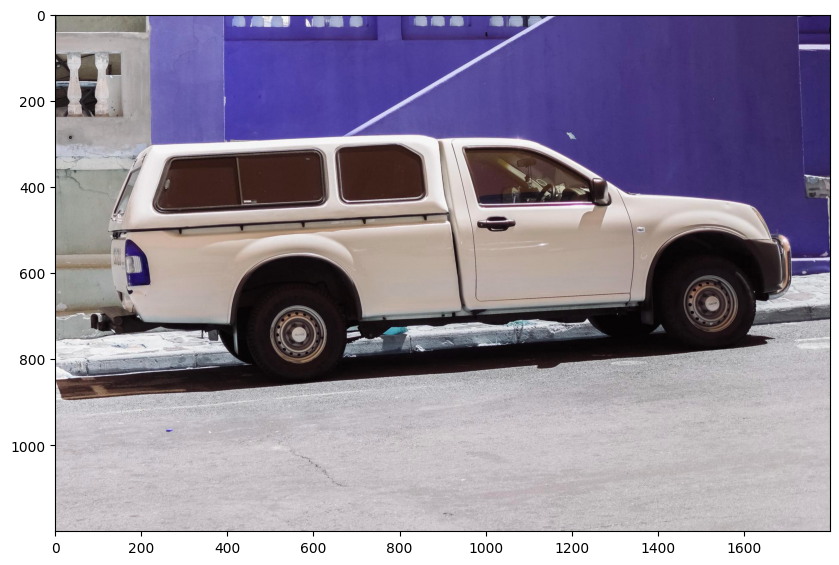

In [9]:
plt.figure(figsize=(10,10))
plt.imshow(image)
plt.axis('on')
plt.show()

In [10]:
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

In [11]:
# image

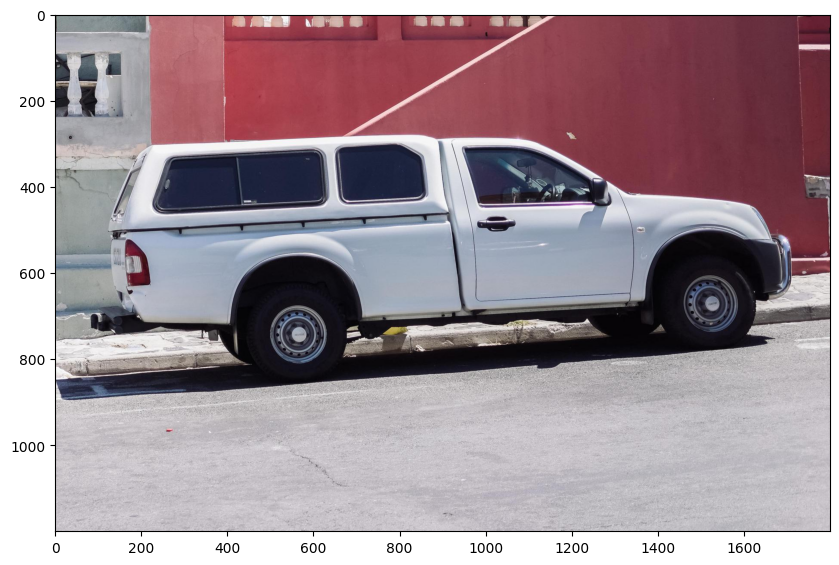

In [12]:
plt.figure(figsize=(10,10))
plt.imshow(image)
plt.axis('on')
plt.show()

# Selecting objects with SAM
First, load the SAM model and predictor. Change the path below to point to the SAM checkpoint. Running on CUDA and using the default model are recommended for best results.

In [13]:
from segment_anything import sam_model_registry, SamPredictor


In [14]:
sam_checkpoint = "/content/drive/MyDrive/Colab_Notebooks/Computer Vision/SAM_SegmentAnything/weights/sam_vit_h_4b8939.pth"
model_type = "vit_h"

device = "cuda"

sam = sam_model_registry[model_type](checkpoint=sam_checkpoint)
sam.to(device=device)

Sam(
  (image_encoder): ImageEncoderViT(
    (patch_embed): PatchEmbed(
      (proj): Conv2d(3, 1280, kernel_size=(16, 16), stride=(16, 16))
    )
    (blocks): ModuleList(
      (0-31): 32 x Block(
        (norm1): LayerNorm((1280,), eps=1e-06, elementwise_affine=True)
        (attn): Attention(
          (qkv): Linear(in_features=1280, out_features=3840, bias=True)
          (proj): Linear(in_features=1280, out_features=1280, bias=True)
        )
        (norm2): LayerNorm((1280,), eps=1e-06, elementwise_affine=True)
        (mlp): MLPBlock(
          (lin1): Linear(in_features=1280, out_features=5120, bias=True)
          (lin2): Linear(in_features=5120, out_features=1280, bias=True)
          (act): GELU(approximate='none')
        )
      )
    )
    (neck): Sequential(
      (0): Conv2d(1280, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (1): LayerNorm2d()
      (2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (3): LayerNorm2d

In [15]:
predictor = SamPredictor(sam)

In [16]:
predictor

## Image Embedding

Process the image to produce an image embedding by calling SamPredictor.set_image.

SamPredictor remembers this embedding and will use it for subsequent mask prediction.

Under the hood, an image encoder produces a one-time embedding for the image, while a lightweight encoder converts any prompt into an embedding vector in real time. These two information sources are then combined in a lightweight decoder that predicts segmentation masks. After the image embedding is computed, SAM can produce a segment in just 50 milliseconds given any prompt in a web browser.

In [17]:
predictor.set_image(image)

In [18]:
predictor

# Points

SAM allows users to segment objects with just a click or by interactively clicking points to include and exclude from the object.

1. To select the truck, choose a point on it.

2. Points are input to the model in (x,y) format and come with labels 1 (foreground point) or 0 (background point).

3. Multiple points can be input; here we use only one. The chosen point will be shown as a star on the image.

In [19]:
input_point = np.array([[500, 375]]) # x, y coordinates
input_label = np.array([1]) # labels 1 (foreground point) or 0 (background point)

In [20]:
'''
def show_points(coords, labels, ax, marker_size=375):
    pos_points = coords[labels==1]
    neg_points = coords[labels==0]
    ax.scatter(pos_points[:, 0], pos_points[:, 1], color='green', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)
    ax.scatter(neg_points[:, 0], neg_points[:, 1], color='red', marker='*', s=marker_size, edgecolor='white', lin
'''

"\ndef show_points(coords, labels, ax, marker_size=375):\n    pos_points = coords[labels==1]\n    neg_points = coords[labels==0]\n    ax.scatter(pos_points[:, 0], pos_points[:, 1], color='green', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)\n    ax.scatter(neg_points[:, 0], neg_points[:, 1], color='red', marker='*', s=marker_size, edgecolor='white', lin\n"

plt.gca():
https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.gca.html

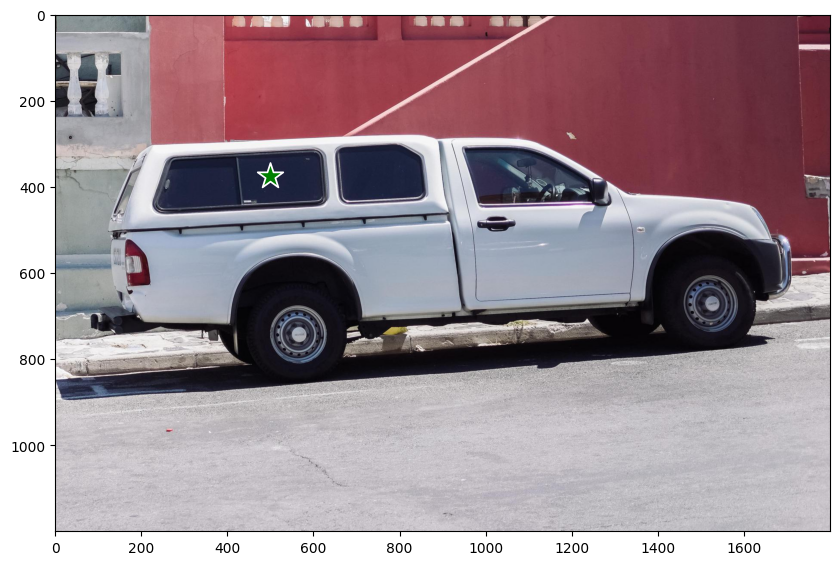

In [21]:
plt.figure(figsize=(10,10))
plt.imshow(image)

show_points(input_point, input_label, plt.gca())

plt.axis('on')
plt.show()

## Prediction

Predict with SamPredictor.predict.

The model returns masks, quality predictions for those masks, and low resolution mask logits that can be passed to the next iteration of prediction.

With multimask_output=True (the default setting), SAM outputs 3 masks, where scores gives the model's own estimation of the quality of these masks. This setting is intended for ambiguous input prompts, and helps the model disambiguate different objects consistent with the prompt.

When False, it will return a single mask. For ambiguous prompts such as a single point, it is recommended to use multimask_output=True even if only a single mask is desired; the best single mask can be chosen by picking the one with the highest score returned in scores. This will often result in a better mask.



In [22]:
masks, scores, logits = predictor.predict(
    point_coords=input_point,
    point_labels=input_label,
    multimask_output=True,
)

In [23]:
# The three masks are
masks

array([[[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]],

       [[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]],

       [[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, Fal

In [24]:
# Score for the 3 masks
scores

array([0.9937421 , 1.0024017 , 0.97769237], dtype=float32)

Logits:  
- Logits is the unnormalized final scores of your model. You apply softmax to it to get a probability distribution over your classes.

https://datascience.stackexchange.com/questions/31041/what-does-logits-in-machine-learning-mean

In [25]:
# Unnormalized final score for 3 masks are
logits

array([[[-18.85803  , -22.520674 , -20.711956 , ..., -25.72896  ,
         -22.27258  , -25.73244  ],
        [-20.232908 , -26.913626 , -20.973545 , ..., -25.771587 ,
         -23.80258  , -25.205025 ],
        [-19.581982 , -22.849363 , -20.514755 , ..., -24.074358 ,
         -21.496443 , -24.55391  ],
        ...,
        [-28.144352 , -41.064697 , -31.769665 , ..., -31.222282 ,
         -27.327896 , -28.629772 ],
        [-36.0101   , -34.352627 , -43.09144  , ..., -26.720526 ,
         -29.426567 , -26.308544 ],
        [-27.948456 , -40.731113 , -31.20381  , ..., -29.319698 ,
         -26.530989 , -26.648018 ]],

       [[-18.857319 , -20.316631 , -19.549633 , ..., -18.829155 ,
         -19.36263  , -19.57943  ],
        [-17.251116 , -22.951906 , -17.5588   , ..., -20.612316 ,
         -18.724438 , -20.053158 ],
        [-17.679335 , -19.584091 , -18.493626 , ..., -18.216341 ,
         -19.154423 , -18.857172 ],
        ...,
        [-25.759634 , -33.888397 , -27.446167 , ..., -

In [26]:
masks.shape #  (num_predicted_masks_per_input) x H x W

(3, 1200, 1800)

# Plot Mask with Point

In [27]:
'''
def show_mask(mask, ax, random_color=False):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        color = np.array([30/255, 144/255, 255/255, 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)
'''

'\ndef show_mask(mask, ax, random_color=False):\n    if random_color:\n        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)\n    else:\n        color = np.array([30/255, 144/255, 255/255, 0.6])\n    h, w = mask.shape[-2:]\n    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)\n    ax.imshow(mask_image)\n'

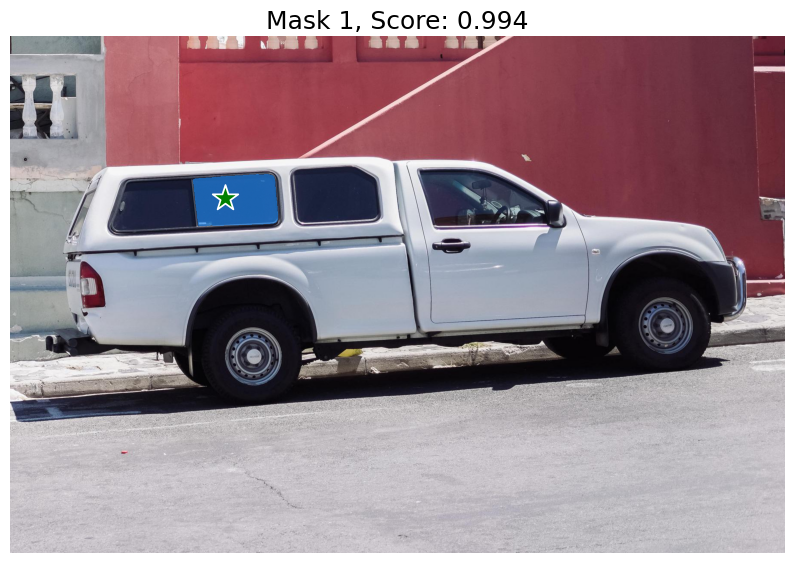

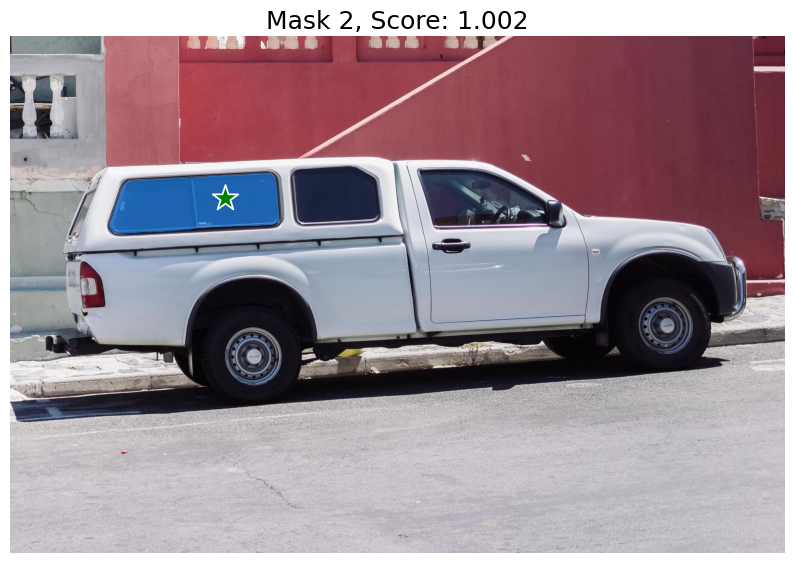

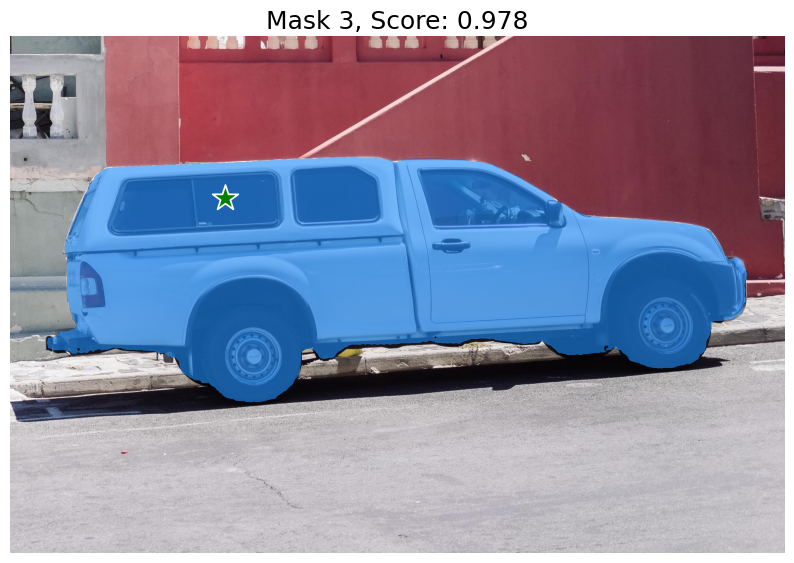

In [28]:
for i, (mask, score) in enumerate(zip(masks, scores)):
    plt.figure(figsize=(10,10))
    plt.imshow(image)

    show_mask(mask, plt.gca())
    show_points(input_point, input_label, plt.gca())

    plt.title(f"Mask {i+1}, Score: {score:.3f}", fontsize=18)
    plt.axis('off')
    plt.show()


# Multi Point

## Specifying a specific object with additional points

The single input point is ambiguous, and the model has returned multiple objects consistent with it.

To obtain a single object, multiple points can be provided.

If available, a mask from a previous iteration can also be supplied to the model to aid in prediction.

When specifying a single object with multiple prompts, a single mask can be requested by setting multimask_output=False.

In [29]:
input_point = np.array([[500, 375], [1125, 625]]) # 2 points
input_label = np.array([1, 1]) # labels 1 (foreground point) or 0 (background point)


In [30]:
scores

array([0.9937421 , 1.0024017 , 0.97769237], dtype=float32)

In [31]:
np.argmax(scores)

1

In [32]:
# a mask from a previous iteration
m_mask_input = logits[np.argmax(scores), :, :]  # Choose the model's best mask

In [33]:
m_masks, m_scores, m_logits = predictor.predict(
    point_coords=input_point,
    point_labels=input_label,
    # adding mask input
    mask_input=m_mask_input[None, :, :],
    multimask_output=False,
)

In [34]:
m_masks

array([[[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]]])

In [35]:
m_scores

array([1.0210207], dtype=float32)

In [36]:
m_logits

array([[[ -7.859381 ,  -8.583146 ,  -7.983081 , ...,  -7.6087213,
          -7.195031 ,  -7.4997315],
        [ -7.5893016,  -9.155002 ,  -7.9044085, ...,  -7.912956 ,
          -7.421338 ,  -7.6311283],
        [ -7.633129 ,  -8.685598 ,  -7.9640093, ...,  -7.095764 ,
          -6.983166 ,  -7.029067 ],
        ...,
        [-16.089634 , -19.941687 , -17.784966 , ..., -19.503529 ,
         -17.14458  , -17.350317 ],
        [-18.192795 , -18.244003 , -21.527468 , ..., -17.033688 ,
         -17.705883 , -16.058193 ],
        [-15.501127 , -18.8791   , -16.126213 , ..., -18.155071 ,
         -16.697437 , -16.297016 ]]], dtype=float32)

In [37]:
m_masks.shape #  (num_predicted_masks_per_input) x H x W

(1, 1200, 1800)

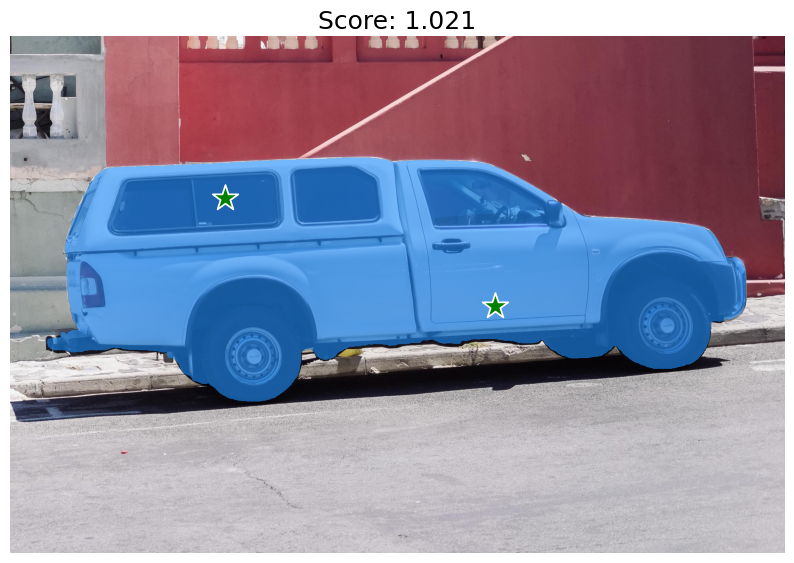

In [38]:
# for i, (mask, score) in enumerate(zip(masks, scores)):
plt.figure(figsize=(10,10))
plt.imshow(image)

# show_mask(mask, plt.gca())
show_mask(m_masks, plt.gca())
show_points(input_point, input_label, plt.gca())

plt.title(f"Score: {m_scores[0]:.3f}", fontsize=18)
plt.axis('off')
plt.show()


# Exclude Object

To exclude the car and specify just the window, a background point (with label 0, here shown in red) can be supplied.

In [39]:
input_point = np.array([[500, 375], [1125, 625]]) # 2 points -> to include and to not include
input_label = np.array([1, 0]) # labels 1 (foreground point) or 0 (background point)

In [40]:
e_mask_input = logits[np.argmax(scores), :, :]  # Choose the model's best mask

In [41]:
e_masks, e_scores, e_logits = predictor.predict(
    point_coords=input_point,
    point_labels=input_label,
    # adding mask input
    mask_input=e_mask_input[None, :, :],
    multimask_output=False,
)

In [42]:
e_masks

array([[[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]]])

In [43]:
e_masks.shape #  (num_predicted_masks_per_input) x H x W

(1, 1200, 1800)

In [44]:
e_scores

array([0.85633767], dtype=float32)

In [45]:
e_logits

array([[[-15.3287945, -16.064213 , -15.297705 , ..., -17.521458 ,
         -17.868294 , -17.259169 ],
        [-15.091961 , -17.666174 , -14.685549 , ..., -19.070143 ,
         -18.332212 , -18.590712 ],
        [-14.294881 , -15.461793 , -14.681473 , ..., -16.712229 ,
         -17.875294 , -17.134256 ],
        ...,
        [-21.897793 , -26.149296 , -22.669544 , ..., -21.920631 ,
         -21.586742 , -20.942698 ],
        [-25.964235 , -25.555832 , -28.508198 , ..., -20.520363 ,
         -23.539463 , -20.781834 ],
        [-21.32539  , -25.53665  , -21.212208 , ..., -21.115547 ,
         -20.942154 , -20.135555 ]]], dtype=float32)

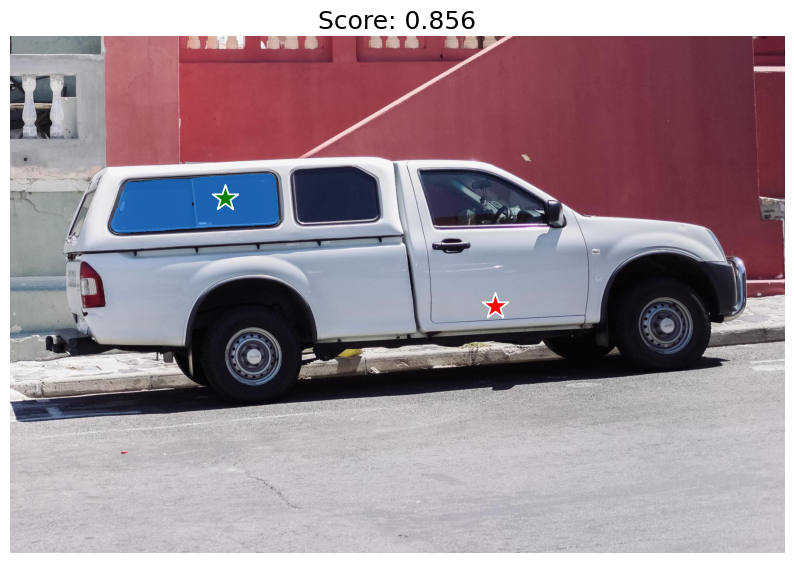

In [46]:
plt.figure(figsize=(10,10))
plt.imshow(image)

# show_mask(mask, plt.gca())
show_mask(e_masks, plt.gca())
show_points(input_point, input_label, plt.gca())

plt.title(f"Score: {e_scores[0]:.3f}", fontsize=18)
plt.axis('off')
plt.show()

# Without using previous mask

In [47]:
input_point = np.array([[500, 375], [1125, 625]]) # 2 points -> to include and to not include
input_label = np.array([1, 0]) # labels 1 (foreground point) or 0 (background point)

In [48]:
ne_masks, ne_scores, ne_logits = predictor.predict(
    point_coords=input_point,
    point_labels=input_label,
    multimask_output=False,
)

In [49]:
ne_masks

array([[[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]]])

In [50]:
ne_masks.shape #  (num_predicted_masks_per_input) x H x W

(1, 1200, 1800)

In [51]:
ne_scores

array([0.7826172], dtype=float32)

In [52]:
ne_logits

array([[[-12.138304, -13.214207, -12.310167, ..., -14.706841,
         -14.484282, -14.58435 ],
        [-12.066685, -14.610401, -12.089144, ..., -15.425288,
         -14.630116, -15.12738 ],
        [-11.550253, -12.654978, -11.828087, ..., -14.016169,
         -14.240531, -14.197791],
        ...,
        [-18.493153, -23.496122, -19.456902, ..., -18.733255,
         -17.585512, -17.835491],
        [-23.836597, -22.891441, -26.262894, ..., -17.326384,
         -19.163612, -17.367771],
        [-18.58235 , -23.512947, -18.809887, ..., -17.82862 ,
         -16.856842, -16.957603]]], dtype=float32)

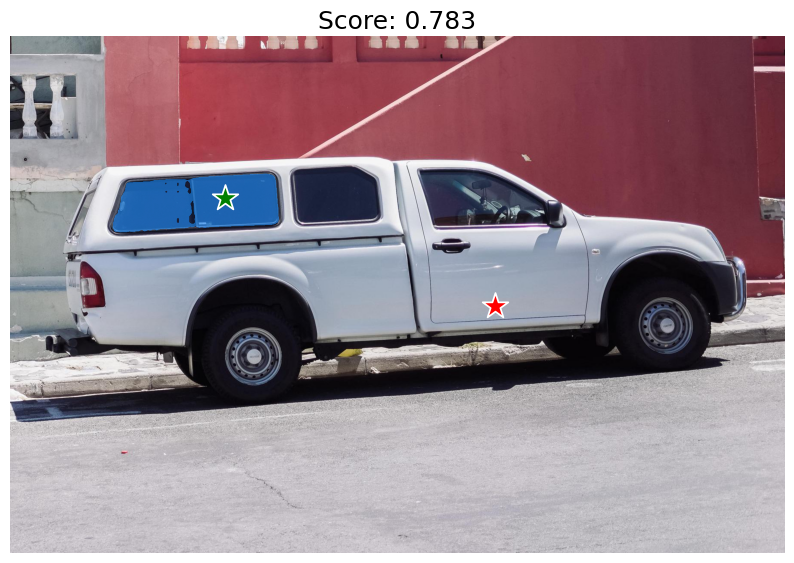

In [53]:
plt.figure(figsize=(10, 10))
plt.imshow(image)

show_mask(ne_masks, plt.gca())
show_points(input_point, input_label, plt.gca())

plt.title(f"Score: {ne_scores[0]:.3f}", fontsize=18)
plt.axis('off')
plt.show()

# Bounding Box

In [54]:
input_box = np.array([425, 600, 700, 875]) # box coordinates

In [55]:
bb_masks, bb_scores, bb_logits = predictor.predict(
    point_coords=None,
    point_labels=None,
    # Box ip
    box=input_box[None, :],
    multimask_output=False,
)

In [56]:
bb_masks

array([[[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]]])

In [57]:
bb_masks.shape #  (num_predicted_masks_per_input) x H x W

(1, 1200, 1800)

In [58]:
bb_scores

array([0.975914], dtype=float32)

In [59]:
bb_logits

array([[[-21.316696, -24.15123 , -22.609447, ..., -23.575855,
         -21.753403, -23.53686 ],
        [-22.03054 , -28.650232, -21.318861, ..., -25.40912 ,
         -24.193146, -24.158493],
        [-22.426273, -24.653294, -22.145199, ..., -21.921955,
         -21.690403, -23.20168 ],
        ...,
        [-26.494635, -37.561974, -25.492788, ..., -25.566631,
         -22.371851, -22.72798 ],
        [-33.613483, -34.419502, -33.75361 , ..., -22.938261,
         -24.961535, -23.800983],
        [-27.205135, -36.789745, -24.59411 , ..., -24.430895,
         -22.192253, -21.872189]]], dtype=float32)

In [60]:
'''
def show_box(box, ax):
    x0, y0 = box[0], box[1]
    w, h = box[2] - box[0], box[3] - box[1]
    ax.add_patch(plt.Rectangle((x0, y0), w, h, edgecolor='green', facecolor=(0,0,0,0), lw=2))
'''

"\ndef show_box(box, ax):\n    x0, y0 = box[0], box[1]\n    w, h = box[2] - box[0], box[3] - box[1]\n    ax.add_patch(plt.Rectangle((x0, y0), w, h, edgecolor='green', facecolor=(0,0,0,0), lw=2))  \n"

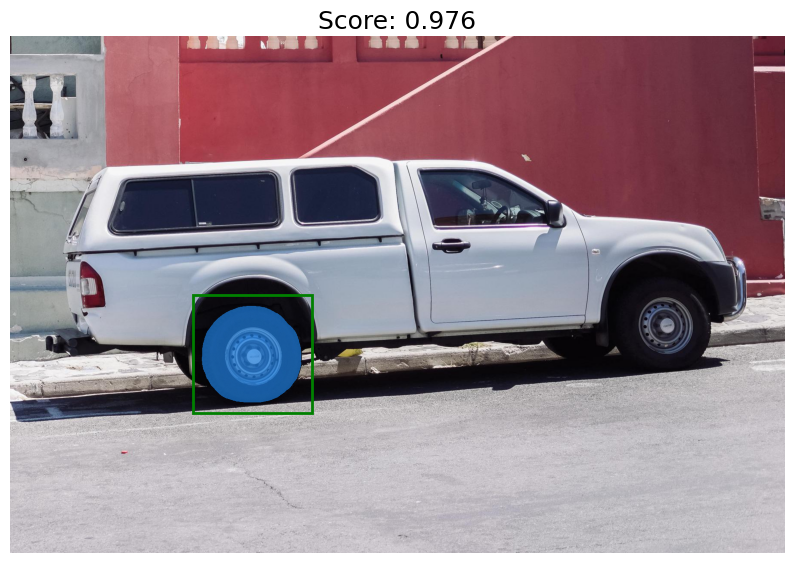

In [61]:
plt.figure(figsize=(10, 10))
plt.imshow(image)

show_mask(bb_masks[0], plt.gca())
show_box(input_box, plt.gca())

plt.title(f"Score: {bb_scores[0]:.3f}", fontsize=18)
plt.axis('off')
plt.show()

# Combining Points and Boxes

Points and boxes may be combined, just by including both types of prompts to the predictor. Here this can be used to select just the trucks's tire, instead of the entire wheel.

In [62]:
# BBox
input_box = np.array([425, 600, 700, 875])

# Points
input_point = np.array([[575, 750]])
input_label = np.array([0]) # 0 (background point) -> donot include

In [63]:
bp_masks, bp_scores, bp_logits = predictor.predict(
    point_coords=input_point,
    point_labels=input_label,
    box=input_box,
    multimask_output=False,
)

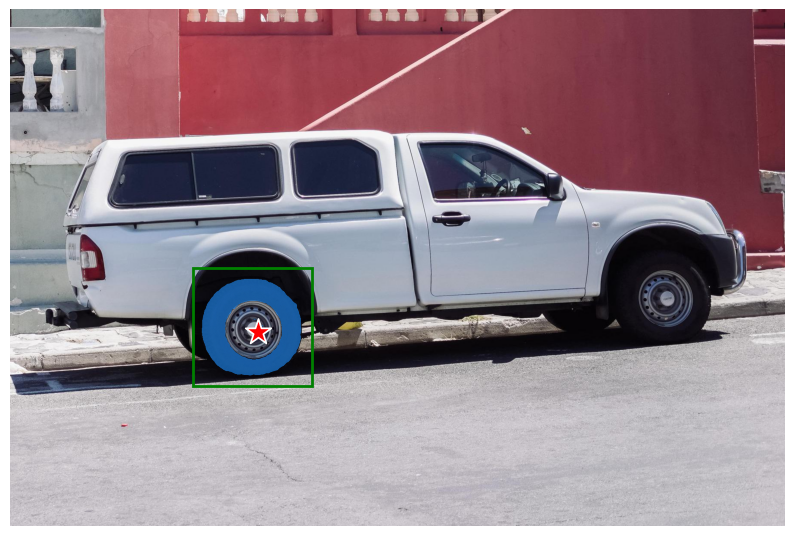

In [64]:
plt.figure(figsize=(10, 10))
plt.imshow(image)

# mask
show_mask(bp_masks[0], plt.gca())
# box
show_box(input_box, plt.gca())
# points
show_points(input_point, input_label, plt.gca())


plt.axis('off')
plt.show()

# Batched prompt inputs

SamPredictor can take multiple input prompts for the same image, using predict_torch method.

This method assumes input points are already **torch tensors** and have already been transformed to the input frame.

For example, imagine we have several box outputs from an object detector.

In [65]:
input_boxes = torch.tensor([
    [75, 275, 1725, 850],
    [425, 600, 700, 875],
    [1375, 550, 1650, 800],
    [1240, 675, 1400, 750],
], device=predictor.device)

In [68]:
input_boxes

tensor([[  75,  275, 1725,  850],
        [ 425,  600,  700,  875],
        [1375,  550, 1650,  800],
        [1240,  675, 1400,  750]], device='cuda:0')

Transform the boxes to the input frame, then predict masks.

SamPredictor stores the necessary transform as the transform field for easy access, though it can also be instantiated directly for use in e.g. a dataloader (see segment_anything.utils.transforms).

In [66]:
transformed_boxes = predictor.transform.apply_boxes_torch(input_boxes, image.shape[:2])

In [67]:
transformed_boxes

tensor([[ 42.6667, 156.5208, 981.3334, 483.7917],
        [241.7778, 341.5000, 398.2222, 498.0208],
        [782.2222, 313.0417, 938.6667, 455.3333],
        [705.4222, 384.1875, 796.4445, 426.8750]], device='cuda:0')

In [69]:
batch_masks, batch_scores, batch_logits = predictor.predict_torch(
    point_coords=None,
    point_labels=None,
    boxes=transformed_boxes,
    multimask_output=False,
)

In [70]:
batch_masks

tensor([[[[False, False, False,  ..., False, False, False],
          [False, False, False,  ..., False, False, False],
          [False, False, False,  ..., False, False, False],
          ...,
          [False, False, False,  ..., False, False, False],
          [False, False, False,  ..., False, False, False],
          [False, False, False,  ..., False, False, False]]],


        [[[False, False, False,  ..., False, False, False],
          [False, False, False,  ..., False, False, False],
          [False, False, False,  ..., False, False, False],
          ...,
          [False, False, False,  ..., False, False, False],
          [False, False, False,  ..., False, False, False],
          [False, False, False,  ..., False, False, False]]],


        [[[False, False, False,  ..., False, False, False],
          [False, False, False,  ..., False, False, False],
          [False, False, False,  ..., False, False, False],
          ...,
          [False, False, False,  ..., False, Fa

In [71]:
batch_masks.shape # (batch_size) x (num_predicted_masks_per_input) x H x W

torch.Size([4, 1, 1200, 1800])

In [72]:
batch_scores

tensor([[0.9938],
        [0.9759],
        [0.9799],
        [0.9541]], device='cuda:0')

In [73]:
batch_logits

tensor([[[[-15.2052, -16.5145, -16.5426,  ..., -16.3582, -15.7460, -16.2433],
          [-14.1652, -18.6979, -14.8611,  ..., -17.3816, -16.0890, -17.0957],
          [-15.7445, -17.4454, -16.1137,  ..., -15.0039, -15.4995, -15.9709],
          ...,
          [-24.0235, -34.0449, -25.7652,  ..., -21.1271, -18.3654, -18.6218],
          [-34.0358, -32.5344, -36.6362,  ..., -17.8091, -20.0839, -18.4998],
          [-25.9298, -35.7807, -26.4311,  ..., -19.1979, -18.2588, -17.7771]]],


        [[[-21.3167, -24.1512, -22.6094,  ..., -23.5758, -21.7534, -23.5369],
          [-22.0306, -28.6502, -21.3189,  ..., -25.4091, -24.1931, -24.1585],
          [-22.4263, -24.6533, -22.1452,  ..., -21.9220, -21.6904, -23.2017],
          ...,
          [-26.4946, -37.5620, -25.4928,  ..., -25.5666, -22.3719, -22.7280],
          [-33.6135, -34.4195, -33.7536,  ..., -22.9383, -24.9615, -23.8010],
          [-27.2051, -36.7897, -24.5941,  ..., -24.4309, -22.1923, -21.8722]]],


        [[[-22.7800, -25.6

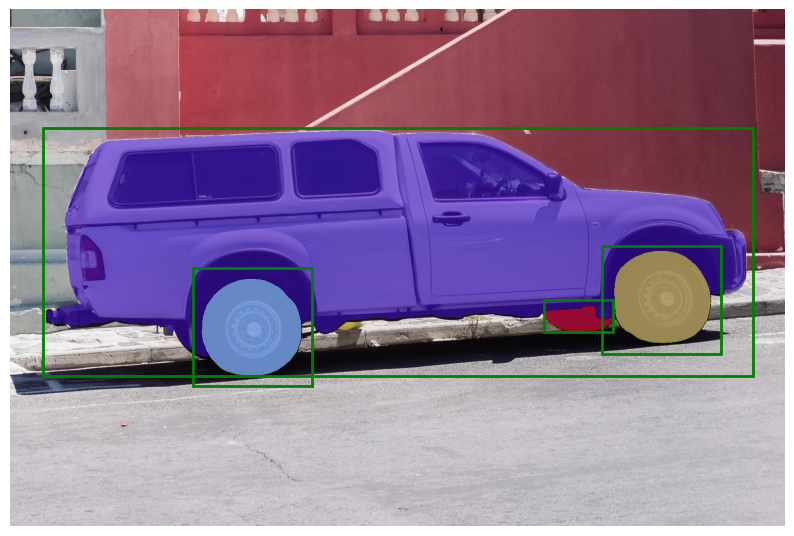

In [75]:
plt.figure(figsize=(10, 10))
plt.imshow(image)

for mask in batch_masks:
    show_mask(mask.cpu().numpy(), plt.gca(), random_color=True)

for box in input_boxes:
    show_box(box.cpu().numpy(), plt.gca())

plt.axis('off')
plt.show()

# Automatically generating object masks with SAM

In [77]:
image = cv2.imread('/content/drive/MyDrive/Colab_Notebooks/Computer Vision/SAM_SegmentAnything/input_images/dog.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

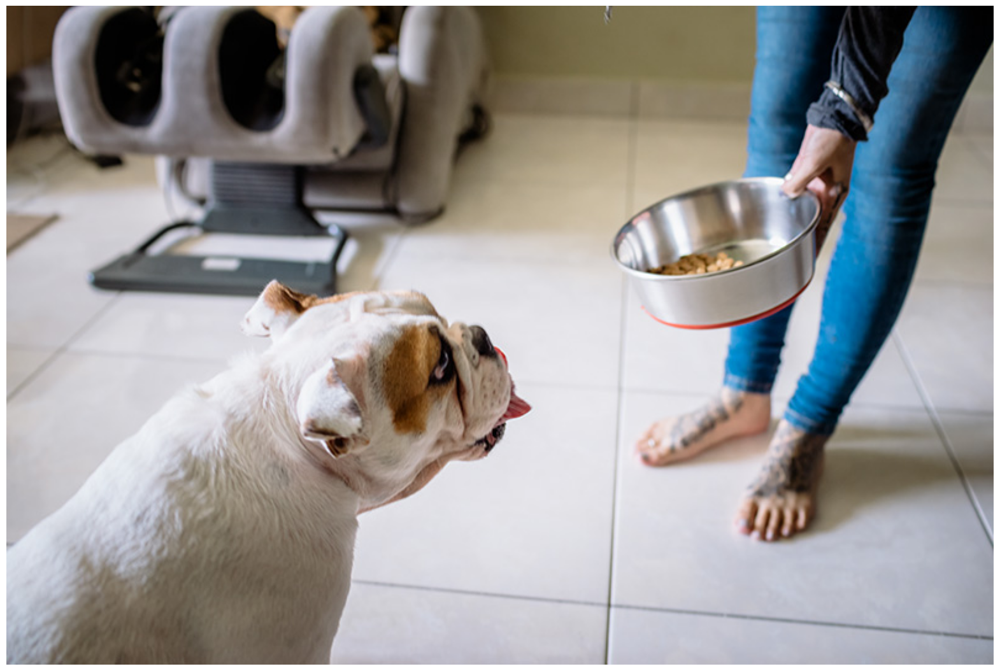

In [78]:
plt.figure(figsize=(20,20))
plt.imshow(image)
plt.axis('off')
plt.show()

# Automatic mask generation
To run automatic mask generation, provide a SAM model to the SamAutomaticMaskGenerator class. Set the path below to the SAM checkpoint. Running on CUDA and with the default model is recommended.

In [79]:
from segment_anything import sam_model_registry, SamAutomaticMaskGenerator, SamPredictor

In [88]:

# sam_checkpoint = "sam_vit_h_4b8939.pth"
# model_type = "vit_h"

# device = "cuda"

# sam = sam_model_registry[model_type](checkpoint=sam_checkpoint)
# sam.to(device=device)

mask_generator = SamAutomaticMaskGenerator(sam)

In [81]:
mask_generator

# Generate masks.

Mask generation returns a list over masks, where each mask is a dictionary containing various data about the mask. These keys are:

- segmentation : the mask
- area : the area of the mask in pixels
- bbox : the boundary box of the mask in XYWH format
- predicted_iou : the model's own prediction for the quality of the mask
- point_coords : the sampled input point that generated this mask
- stability_score : an additional measure of mask quality
- crop_box : the crop of the image used to generate this mask in XYWH format

In [83]:
auto_masks = mask_generator.generate(image)

In [84]:
len(auto_masks) # Number of mask generated

66

In [85]:
auto_masks[0].keys()

dict_keys(['segmentation', 'area', 'bbox', 'predicted_iou', 'point_coords', 'stability_score', 'crop_box'])

In [86]:
auto_masks

[{'segmentation': array([[False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         ...,
         [ True,  True,  True, ..., False, False, False],
         [ True,  True,  True, ..., False, False, False],
         [False, False, False, ..., False, False, False]]),
  'area': 76377,
  'bbox': [0, 223, 422, 309],
  'predicted_iou': 1.0341999530792236,
  'point_coords': [[362.5, 258.65625]],
  'stability_score': 0.9911314249038696,
  'crop_box': [0, 0, 800, 534]},
 {'segmentation': array([[False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         ...,
         [False, False, False, ...,  True,  True,  True],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False]]),
  'area': 186558,
  'bbox': [0, 87, 799,

In [76]:
'''
def show_anns(anns):
    if len(anns) == 0:
        return
    sorted_anns = sorted(anns, key=(lambda x: x['area']), reverse=True)
    ax = plt.gca()
    ax.set_autoscale_on(False)

    img = np.ones((sorted_anns[0]['segmentation'].shape[0], sorted_anns[0]['segmentation'].shape[1], 4))
    img[:,:,3] = 0
    for ann in sorted_anns:
        m = ann['segmentation']
        color_mask = np.concatenate([np.random.random(3), [0.35]])
        img[m] = color_mask
    ax.imshow(img)
'''


"\ndef show_anns(anns):\n    if len(anns) == 0:\n        return\n    sorted_anns = sorted(anns, key=(lambda x: x['area']), reverse=True)\n    ax = plt.gca()\n    ax.set_autoscale_on(False)\n\n    img = np.ones((sorted_anns[0]['segmentation'].shape[0], sorted_anns[0]['segmentation'].shape[1], 4))\n    img[:,:,3] = 0\n    for ann in sorted_anns:\n        m = ann['segmentation']\n        color_mask = np.concatenate([np.random.random(3), [0.35]])\n        img[m] = color_mask\n    ax.imshow(img)\n"

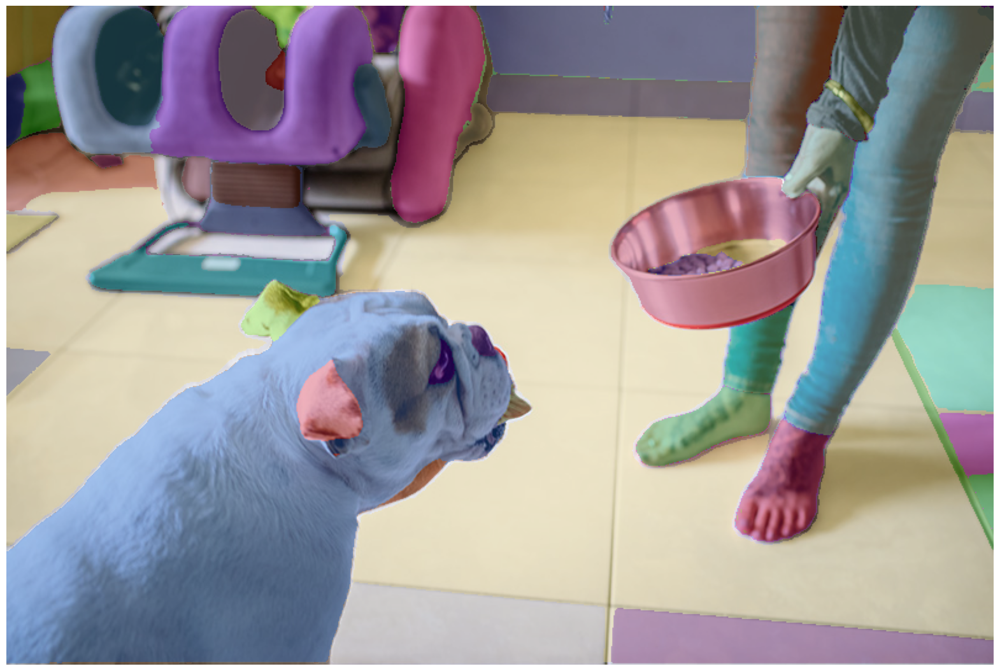

In [87]:
plt.figure(figsize=(20,20))
plt.imshow(image)

show_anns(masks)

plt.axis('off')
plt.show()

# Parameter Tuning

Automatic mask generation options

There are several tunable parameters in automatic mask generation that control how densely points are sampled and what the thresholds are for removing low quality or duplicate masks.

Additionally, generation can be automatically run on crops of the image to get improved performance on smaller objects, and post-processing can remove stray pixels and holes. Here is an example configuration that samples more masks:

In [97]:
mask_generator_2 = SamAutomaticMaskGenerator(
    model=sam,
    points_per_side=32,
    pred_iou_thresh=0.86,
    stability_score_thresh=0.92,
    crop_n_layers=1,
    crop_n_points_downscale_factor=2,
    min_mask_region_area=100,  # Requires open-cv to run post-processing
)

In [98]:
masks2 = mask_generator_2.generate(image)

In [99]:
len(masks2)

90

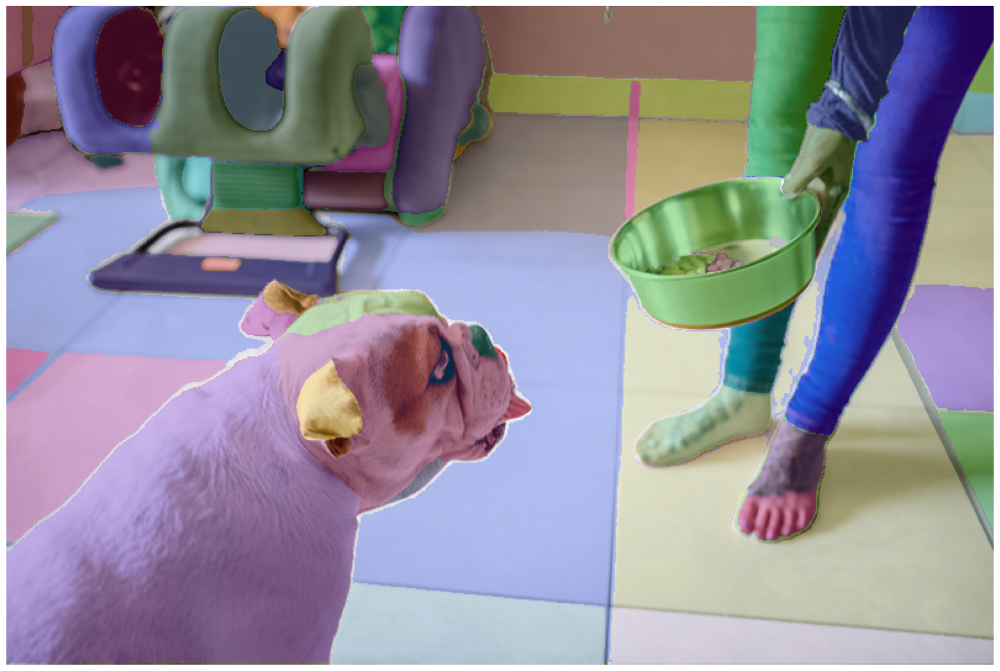

In [100]:
plt.figure(figsize=(20,20))
plt.imshow(image)

show_anns(masks2)

plt.axis('off')
plt.show()

# End-to-end batched inference

If all prompts are available in advance, it is possible to run SAM directly in an end-to-end fashion. This also allows batching over images.

In [101]:
image1 = cv2.imread('/content/drive/MyDrive/Colab_Notebooks/Computer Vision/SAM_SegmentAnything/input_images/truck.jpg')
image1 = cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)
image1_boxes = torch.tensor([
    [75, 275, 1725, 850],
    [425, 600, 700, 875],
    [1375, 550, 1650, 800],
    [1240, 675, 1400, 750],
], device=sam.device)

image2 = cv2.imread('/content/drive/MyDrive/Colab_Notebooks/Computer Vision/SAM_SegmentAnything/input_images/groceries.jpg')
image2 = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)
image2_boxes = torch.tensor([
    [450, 170, 520, 350],
    [350, 190, 450, 350],
    [500, 170, 580, 350],
    [580, 170, 640, 350],
], device=sam.device)

Both images and prompts are input as PyTorch tensors that are already transformed to the correct frame.

Inputs are packaged as a list over images, which each element is a dict that takes the following keys:

- image: The input image as a PyTorch tensor in CHW format.
- original_size: The size of the image before transforming for input to SAM, in (H, W) format.
- point_coords: Batched coordinates of point prompts.
- point_labels: Batched labels of point prompts.
- boxes: Batched input boxes.
- mask_inputs: Batched input masks.
If a prompt is not present, the key can be excluded.

In [102]:
from segment_anything.utils.transforms import ResizeLongestSide

In [103]:
resize_transform = ResizeLongestSide(sam.image_encoder.img_size)

In [104]:
resize_transform

In [106]:
def prepare_image(image, transform, device):
    image = transform.apply_image(image)
    image = torch.as_tensor(image, device=device.device)
    return image.permute(2, 0, 1).contiguous()

In [107]:
batched_input = [
     {
         'image': prepare_image(image1, resize_transform, sam),
         'boxes': resize_transform.apply_boxes_torch(image1_boxes, image1.shape[:2]),
         'original_size': image1.shape[:2]
     },
     {
         'image': prepare_image(image2, resize_transform, sam),
         'boxes': resize_transform.apply_boxes_torch(image2_boxes, image2.shape[:2]),
         'original_size': image2.shape[:2]
     }
]

## Run Model

In [108]:
batched_output = sam(batched_input, multimask_output=False)

In [110]:
len(batched_output)

2

The output is a list over results for each input image, where list elements are dictionaries with the following keys:

- masks: A batched torch tensor of predicted binary masks, the size of the original image.
- iou_predictions: The model's prediction of the quality for each mask.
- low_res_logits: Low res logits for each mask, which can be passed back to the model as mask input on a later iteration.

In [111]:
batched_output[0].keys()

dict_keys(['masks', 'iou_predictions', 'low_res_logits'])

In [109]:
batched_output

[{'masks': tensor([[[[False, False, False,  ..., False, False, False],
            [False, False, False,  ..., False, False, False],
            [False, False, False,  ..., False, False, False],
            ...,
            [False, False, False,  ..., False, False, False],
            [False, False, False,  ..., False, False, False],
            [False, False, False,  ..., False, False, False]]],
  
  
          [[[False, False, False,  ..., False, False, False],
            [False, False, False,  ..., False, False, False],
            [False, False, False,  ..., False, False, False],
            ...,
            [False, False, False,  ..., False, False, False],
            [False, False, False,  ..., False, False, False],
            [False, False, False,  ..., False, False, False]]],
  
  
          [[[False, False, False,  ..., False, False, False],
            [False, False, False,  ..., False, False, False],
            [False, False, False,  ..., False, False, False],
           

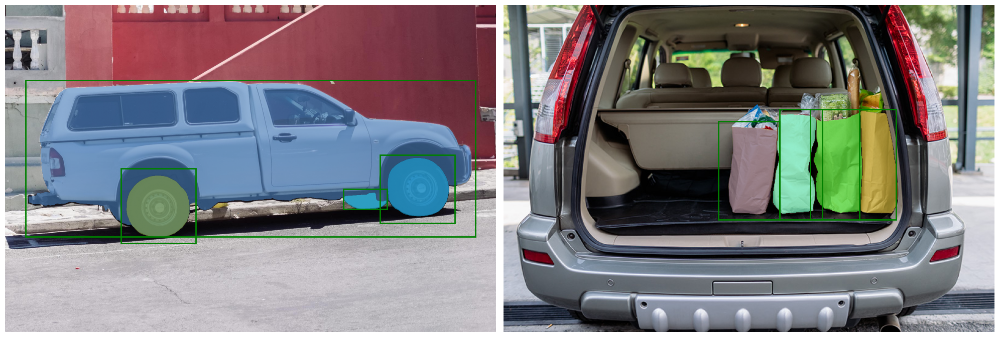

In [112]:
fig, ax = plt.subplots(1, 2, figsize=(20, 20))

ax[0].imshow(image1)
for mask in batched_output[0]['masks']:
    show_mask(mask.cpu().numpy(), ax[0], random_color=True)
for box in image1_boxes:
    show_box(box.cpu().numpy(), ax[0])
ax[0].axis('off')

ax[1].imshow(image2)
for mask in batched_output[1]['masks']:
    show_mask(mask.cpu().numpy(), ax[1], random_color=True)
for box in image2_boxes:
    show_box(box.cpu().numpy(), ax[1])
ax[1].axis('off')

plt.tight_layout()
plt.show()